In [26]:
# 1. Import the necessary librariesimport libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [27]:
# 2. Read the dataset

df = pd.read_csv('PEP1.csv')

In [19]:
# 2.1 Understand the dataset

df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [7]:
# 2.2 Print the name of the columns

print("Columns: ", df.columns)

Columns:  Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'Bedroom', 'Kitchen', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive

In [9]:
# 2.3 Print the shape of the dataframe

print("Shape: ", df.shape)

Shape:  (1460, 81)


In [3]:
# 2.4 Check missing values in all columns
missing_values = df.isnull().sum()

# Display the columns with missing values (if any) and the corresponding count
print("Missing values in each column:\n", missing_values[missing_values > 0])

Missing values in each column:
 LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


In [4]:
# 2.5 Print unique values

print("Unique values:\n", df.nunique())

Unique values:
 Id               1460
MSSubClass         15
MSZoning            5
LotFrontage       110
LotArea          1073
                 ... 
MoSold             12
YrSold              5
SaleType            9
SaleCondition       6
SalePrice         663
Length: 81, dtype: int64


In [28]:
# 2.6 Select the numerical and categorical variables

numerical_vars = df.select_dtypes(include=['number']).columns
categorical_vars = df.select_dtypes(include=['object']).columns

print("Numerical variables:\n", numerical_vars)
print("Categorical variables:\n", categorical_vars)

Numerical variables:
 Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'Bedroom', 'Kitchen', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')
Categorical variables:
 Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',

# 3.Descriptive stats and EDA

In [29]:
# 3.1 EDA of numerical variables

numerical_vars = df.select_dtypes(include=['number'])
numerical_vars

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,192,84,0,0,0,0,0,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,62.0,7917,6,5,1999,2000,0.0,0,...,0,40,0,0,0,0,0,8,2007,175000
1456,1457,20,85.0,13175,6,6,1978,1988,119.0,790,...,349,0,0,0,0,0,0,2,2010,210000
1457,1458,70,66.0,9042,7,9,1941,2006,0.0,275,...,0,60,0,0,0,0,2500,5,2010,266500
1458,1459,20,68.0,9717,5,6,1950,1996,0.0,49,...,366,0,112,0,0,0,0,4,2010,142125


In [30]:
# Descriptive statistics
descriptive_stats = numerical_vars.describe()
print("Descriptive Statistics:\n", descriptive_stats)

Descriptive Statistics:
                 Id   MSSubClass  LotFrontage        LotArea  OverallQual  \
count  1460.000000  1460.000000  1201.000000    1460.000000  1460.000000   
mean    730.500000    56.897260    70.049958   10516.828082     6.099315   
std     421.610009    42.300571    24.284752    9981.264932     1.382997   
min       1.000000    20.000000    21.000000    1300.000000     1.000000   
25%     365.750000    20.000000    59.000000    7553.500000     5.000000   
50%     730.500000    50.000000    69.000000    9478.500000     6.000000   
75%    1095.250000    70.000000    80.000000   11601.500000     7.000000   
max    1460.000000   190.000000   313.000000  215245.000000    10.000000   

       OverallCond    YearBuilt  YearRemodAdd   MasVnrArea   BsmtFinSF1  ...  \
count  1460.000000  1460.000000   1460.000000  1452.000000  1460.000000  ...   
mean      5.575342  1971.267808   1984.865753   103.685262   443.639726  ...   
std       1.112799    30.202904     20.645407   18

In [31]:
# 3.2 Missing value treatment 

# Fill numerical missing values with 0
df.fillna(0, inplace=True)

# Fill categorical missing values with "none"
categorical_vars = df.select_dtypes(include=['object']).columns
df[categorical_vars] = df[categorical_vars].fillna("none")

# Verify if missing values have been filled
print("Missing values after treatment:\n", df.isnull().sum())

Missing values after treatment:
 Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 81, dtype: int64


Skewness:
 Id                0.000000
MSSubClass        1.407657
LotFrontage       2.163569
LotArea          12.207688
OverallQual       0.216944
OverallCond       0.693067
YearBuilt        -0.613461
YearRemodAdd     -0.503562
MasVnrArea        2.669084
BsmtFinSF1        1.685503
BsmtFinSF2        4.255261
BsmtUnfSF         0.920268
TotalBsmtSF       1.524255
1stFlrSF          1.376757
2ndFlrSF          0.813030
LowQualFinSF      9.011341
GrLivArea         1.366560
BsmtFullBath      0.596067
BsmtHalfBath      4.103403
FullBath          0.036562
HalfBath          0.675897
Bedroom           0.211790
Kitchen           4.488397
TotRmsAbvGrd      0.676341
Fireplaces        0.649565
GarageYrBlt      -0.649415
GarageCars       -0.342549
GarageArea        0.179981
WoodDeckSF        1.541376
OpenPorchSF       2.364342
EnclosedPorch     3.089872
3SsnPorch        10.304342
ScreenPorch       4.122214
PoolArea         14.828374
MiscVal          24.476794
MoSold            0.212053
YrSold           

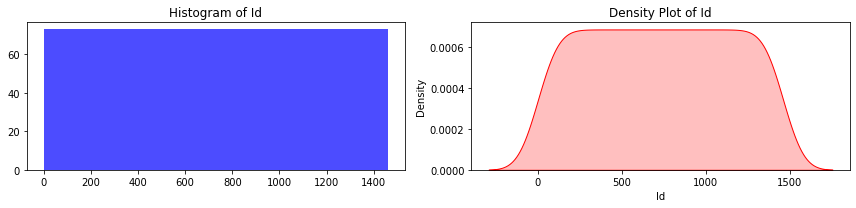

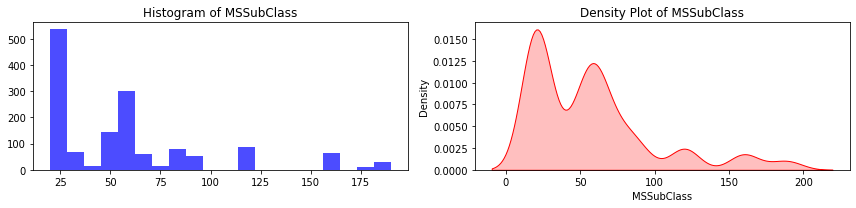

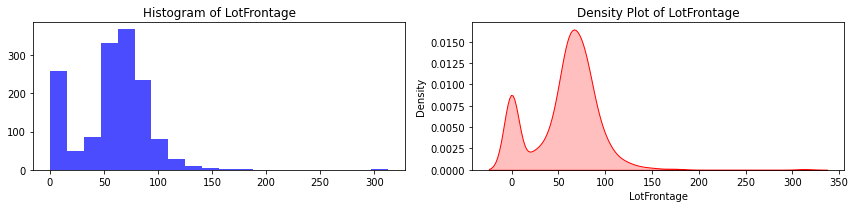

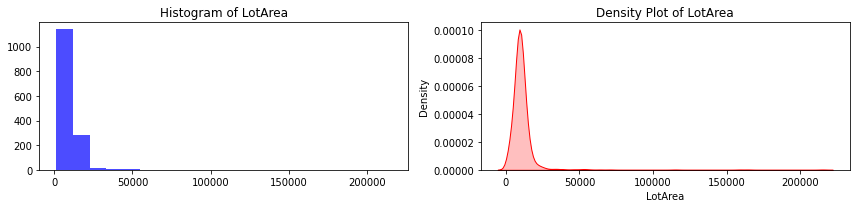

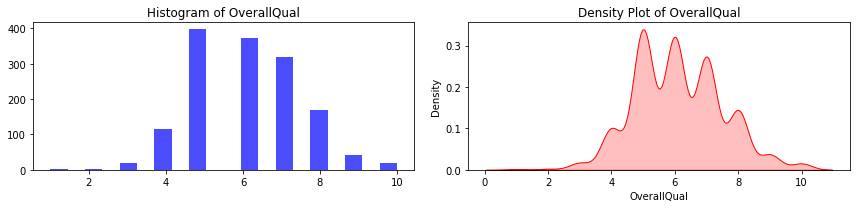

...

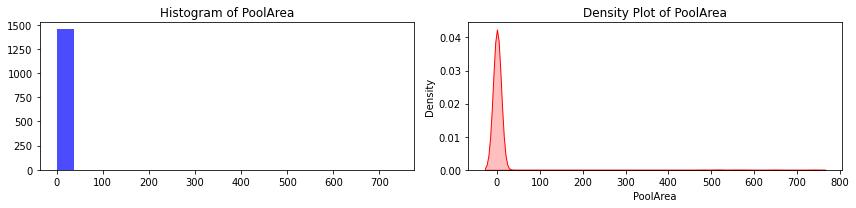

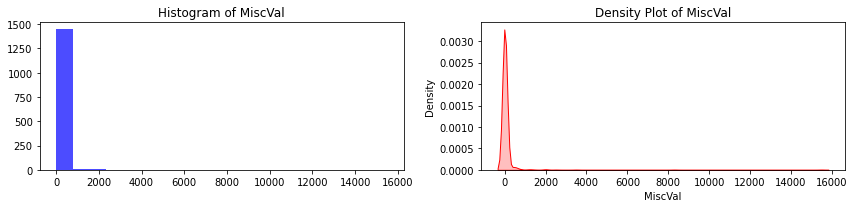

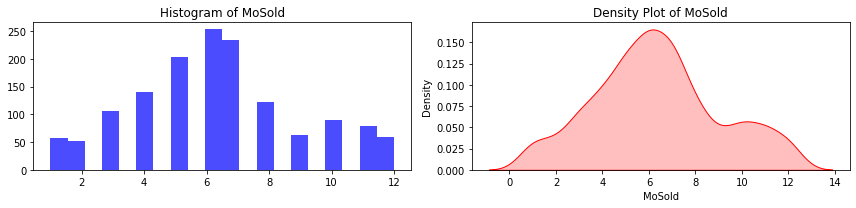

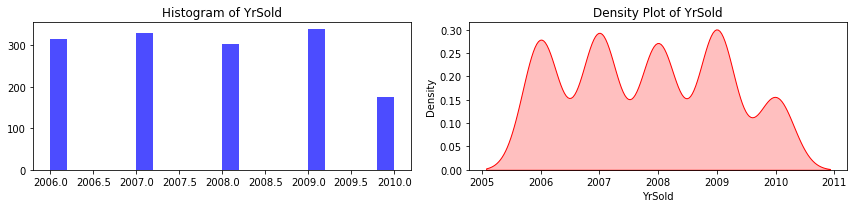

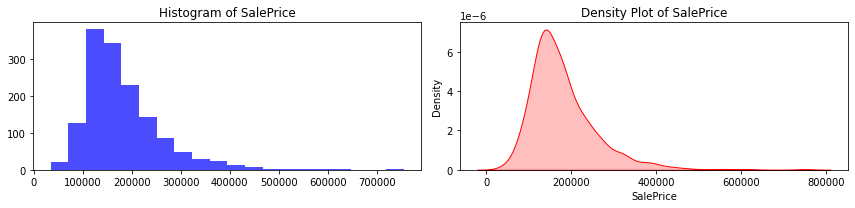

In [32]:
# 3.3 Identify the skewness and distribution

# Identify skewness
skewness = numerical_vars.skew()
print("Skewness:\n", skewness)

# Number of columns in the grid
num_cols = 6  # Adjust the number of columns as needed

# Calculate the number of rows needed based on the number of numerical variables
num_rows = 3

# Visualize skewness and distribution using histograms and density plots
for i, column in enumerate(numerical_vars.columns):
    # Create subplots with a grid layout
    plt.figure(figsize=(12, 3))
    
    # Histogram
    plt.subplot(1, 2, 1)
    plt.hist(df[column], bins=20, color='blue', alpha=0.7)
    plt.title(f'Histogram of {column}')
    
    # Density plot
    plt.subplot(1, 2, 2)
    sns.kdeplot(df[column], color='red', shade=True)
    plt.title(f'Density Plot of {column}')
    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()

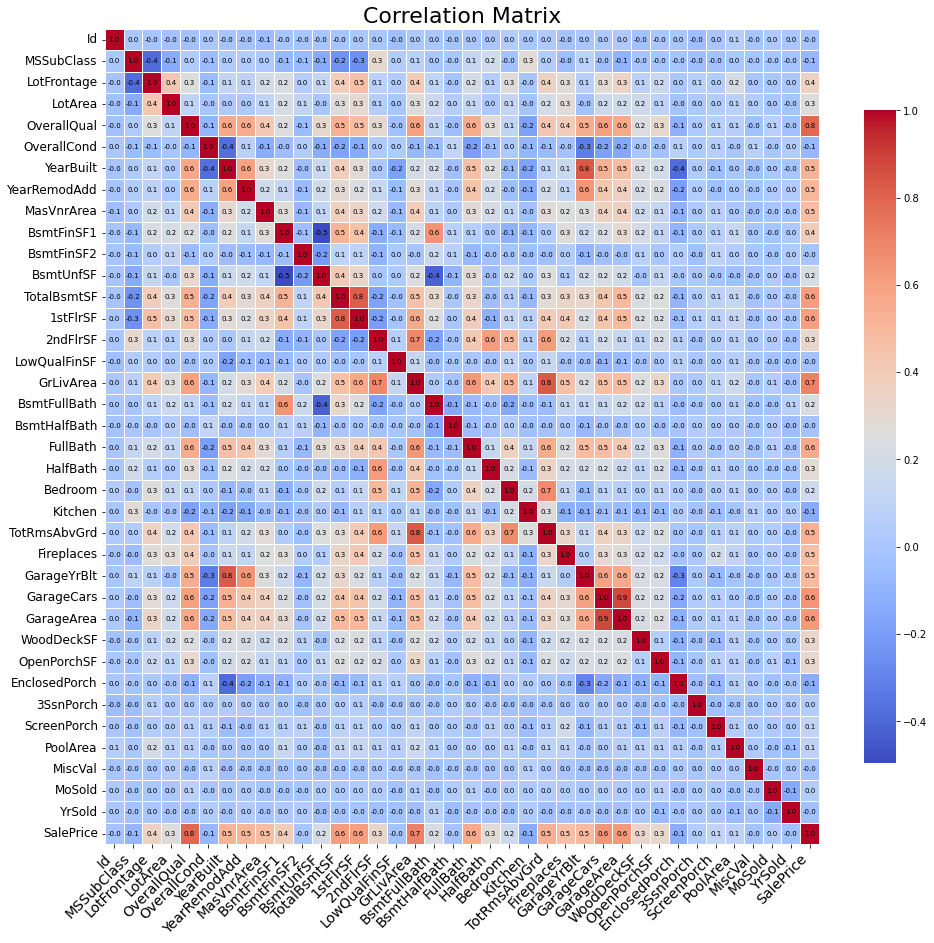

In [9]:
# 3.4 Identify significant variables using a correlation matrix

correlation_matrix = numerical_vars.corr()

# Enlarge the whole heatmap
plt.figure(figsize=(16, 15))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".1f", linewidths=.5, annot_kws={"size": 7, "color": 'black'}, cbar_kws={"shrink": 0.8})
plt.title("Correlation Matrix", fontsize=22)  # Increase title font size
plt.xticks(rotation=45, ha="right", fontsize=14)
plt.yticks(rotation=0, fontsize=12)
plt.show()

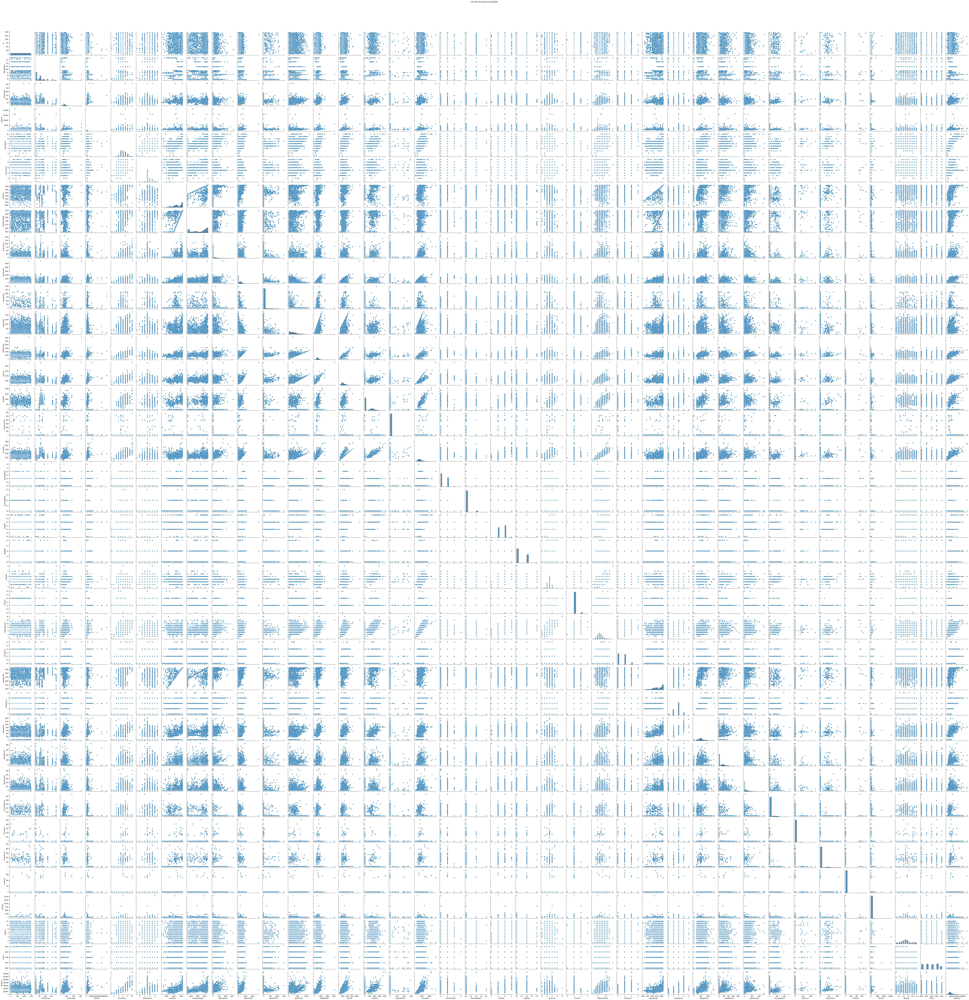

In [7]:
# 3.5 Pair plot for distribution and density
sns.pairplot(numerical_vars)
plt.suptitle("Pair Plot of Numerical Variables", y=1.02)
plt.show()

# 4.EDA of categorical variables

       MSZoning Street  Alley LotShape LandContour Utilities LotConfig  \
count      1460   1460   1460     1460        1460      1460      1460   
unique        5      2      3        4           4         2         5   
top          RL   Pave      0      Reg         Lvl    AllPub    Inside   
freq       1151   1454   1369      925        1311      1459      1052   

       LandSlope Neighborhood Condition1  ... GarageType GarageFinish  \
count       1460         1460       1460  ...       1460         1460   
unique         3           25          9  ...          7            4   
top          Gtl          mes       Norm  ...     Attchd          Unf   
freq        1382          225       1260  ...        870          605   

       GarageQual GarageCond PavedDrive PoolQC Fence MiscFeature SaleType  \
count        1460       1460       1460   1460  1460        1460     1460   
unique          6          6          3      4     5           5        9   
top            TA         TA    

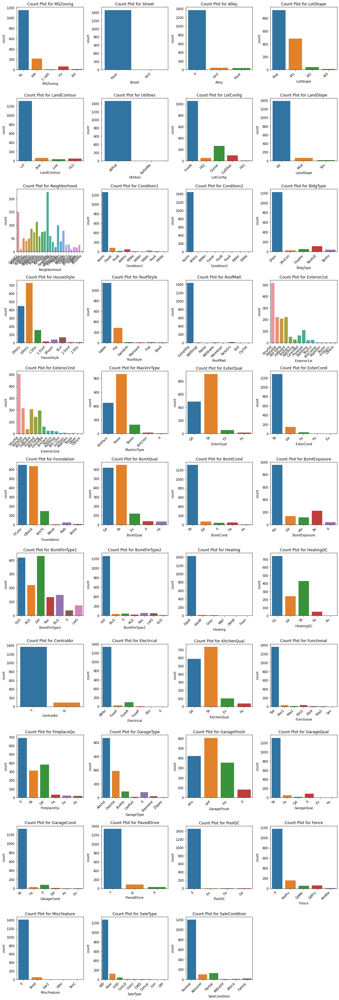

In [12]:

# Display basic statistics of categorical variables
print(df.describe(include='object'))

# Display basic statistics of categorical variables
print(df.describe(include='object'))

# Count plot for each categorical variable
num_categorical_cols = len(df.select_dtypes(include='object').columns)
num_rows = (num_categorical_cols // 4) + (num_categorical_cols % 4 > 0)

plt.figure(figsize=(15, num_rows * 4))
for i, column in enumerate(df.select_dtypes(include='object').columns):
    plt.subplot(num_rows, 4, i+1)
    sns.countplot(x=column, data=df)
    plt.title(f'Count Plot for {column}')
    plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

In [38]:
# 4.a Handling Missing Values:

# Check for missing values in categorical columns
missing_categorical = significant_df.select_dtypes(include='object').isnull().sum()
print("Missing Values in Categorical Columns:")
print(missing_categorical)

# Impute missing values (replace with 'none' or most frequent category)
significant_df.fillna(value={'Categorical_Column': 'none'}, inplace=True)

Missing Values in Categorical Columns:
MSZoning          0
Neighborhood      0
Exterior2nd       0
Exterior1st       0
GarageQual       81
GarageCond       81
SaleType          0
SaleCondition     0
dtype: int64


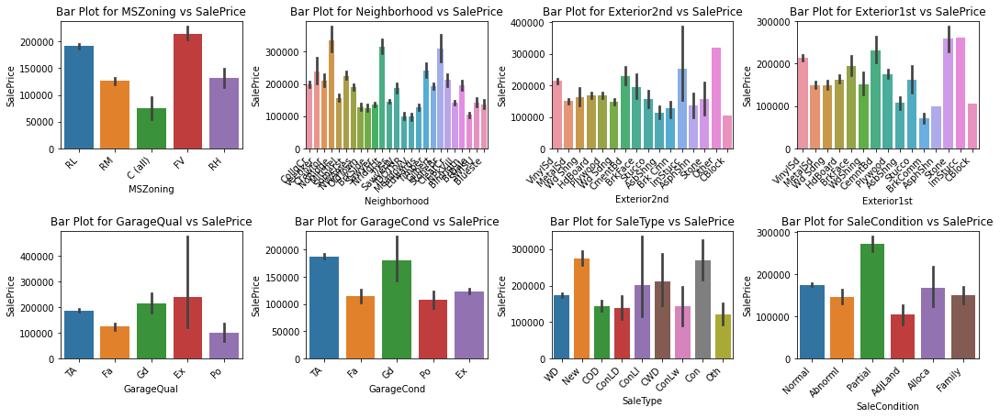

In [40]:
# 4.b Bivariate Analysis with Target Variable
plt.figure(figsize=(15, 12))
for i, column in enumerate(significant_df.select_dtypes(include='object').columns):
    plt.subplot(4, 4, i + 1)
    sns.barplot(x=column, y='SalePrice', data=significant_df)
    plt.title(f'Bar Plot for {column} vs SalePrice')
    plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [41]:
# 4.C Identify significant variables using p-values and Chi-Square values

# Store p-values and Chi-Square values
chi2_values = {}
p_values = {}

# Identify significant variables using Chi-Square Test
for col1 in df.select_dtypes(include='object').columns:
    for col2 in df.select_dtypes(include='object').columns:
        if col1 != col2:
            contingency_table = pd.crosstab(df[col1], df[col2])
            
            # Check if the contingency table is not empty
            if contingency_table.size > 0:
                chi2, p, _, _ = chi2_contingency(contingency_table)
                chi2_values[(col1, col2)] = chi2
                p_values[(col1, col2)] = p

# Sort variables based on p-values
sorted_p_values = sorted(p_values.items(), key=lambda x: x[1])

# Print top 10 significant variables
print("Top 10 significant variables based on p-values:")
for (col1, col2), p_value in sorted_p_values[:10]:
    print(f"{col1} and {col2} - p-value: {p_value}, Chi-Square value: {chi2_values[(col1, col2)]}")

Top 10 significant variables based on p-values:
MSZoning and Neighborhood - p-value: 0.0, Chi-Square value: 2486.263987999627
Neighborhood and MSZoning - p-value: 0.0, Chi-Square value: 2486.2639879996264
Neighborhood and Exterior2nd - p-value: 0.0, Chi-Square value: 2543.991276041277
Exterior1st and Exterior2nd - p-value: 0.0, Chi-Square value: 11868.678367195604
Exterior2nd and Neighborhood - p-value: 0.0, Chi-Square value: 2543.991276041277
Exterior2nd and Exterior1st - p-value: 0.0, Chi-Square value: 11868.6783671956
Foundation and BsmtQual - p-value: 0.0, Chi-Square value: 1664.4943148860546
BsmtQual and Foundation - p-value: 0.0, Chi-Square value: 1664.4943148860543
BsmtQual and BsmtCond - p-value: 0.0, Chi-Square value: 1631.9724267986737
BsmtQual and BsmtExposure - p-value: 0.0, Chi-Square value: 1596.1099051272488


In [14]:
# 5. Combine all the significant categorical and numerical variables

# Assuming df is your original dataframe

# List of top 10 significant categorical variables
top_categorical_variables = ['MSZoning', 'Neighborhood', 'Exterior2nd', 'Exterior1st', 'GarageQual', 'GarageCond', 'SaleType', 'SaleCondition']

# List of corresponding numerical variables (you can customize this based on your actual dataset)
top_numerical_variables = ['SalePrice', 'OverallQual', 'OverallCond', 'YearBuilt', 'GarageYrBlt']

# Create a new dataframe with significant variables
significant_df = df[top_categorical_variables + top_numerical_variables]

# Display the new dataframe
print(significant_df.head())

  MSZoning Neighborhood Exterior2nd Exterior1st GarageQual GarageCond  \
0       RL      CollgCr     VinylSd     VinylSd         TA         TA   
1       RL      Veenker     MetalSd     MetalSd         TA         TA   
2       RL      CollgCr     VinylSd     VinylSd         TA         TA   
3       RL      Crawfor     Wd Shng     Wd Sdng         TA         TA   
4       RL      NoRidge     VinylSd     VinylSd         TA         TA   

  SaleType SaleCondition  SalePrice  OverallQual  OverallCond  YearBuilt  \
0       WD        Normal     208500            7            5       2003   
1       WD        Normal     181500            6            8       1976   
2       WD        Normal     223500            7            5       2001   
3       WD       Abnorml     140000            7            5       1915   
4       WD        Normal     250000            8            5       2000   

   GarageYrBlt  
0       2003.0  
1       1976.0  
2       2001.0  
3       1998.0  
4       2000.0  


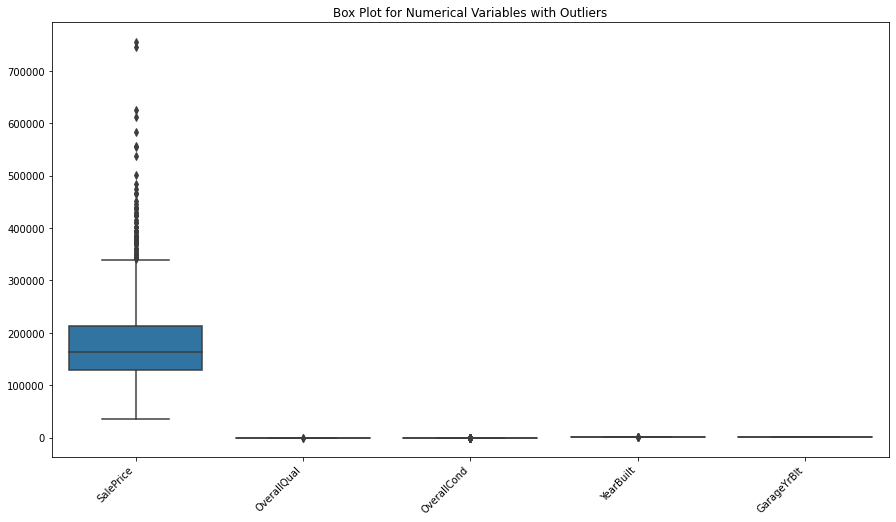

In [15]:
# 6. Plot box plot for the new dataset to find the variables with outliers


# Set up the figure with desired size
plt.figure(figsize=(15, 8))

# Plot box plots for numerical variables
sns.boxplot(data=significant_df.select_dtypes(include='number'))

# Set the plot title
plt.title("Box Plot for Numerical Variables with Outliers")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.show()

# Boxplot analysis

The boxplot shows the distribution of the numerical variable SalePrice in a house sales dataset.

The median sale price is $200,000, with a range from $100,000 to $700,000.
This suggests that most of the houses in the dataset are priced between $100,000 and $300,000. 
There are a few outliers on the high end, with some houses priced as high as $700,000.

The interquartile range (IQR) is $50,000, 
which means that the middle 50% of the houses are priced within $50,000 of the median price.

There are no outliers on the low end, which suggests that there are no houses in the dataset that are priced below $100,000.

Overall, the boxplot suggests that the distribution of sale prices in the house sales dataset is skewed to the right,
with a few high-priced outliers.

# Linear Regression Model

In [20]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Assuming significant_df is your new dataset containing significant variables

# Separate features (X) and target variable (y)
X = significant_df.drop('SalePrice', axis=1)  # Assuming 'SalePrice' is your target variable
y = significant_df['SalePrice']

# Perform one-hot encoding for categorical variables
X_encoded = pd.get_dummies(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Initialize the imputer to handle missing values (NaN)
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy if needed

# Fit the imputer on the training data and transform both training and testing data
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Initialize the linear regression model
model = LinearRegression()

# Train the model on the training set with imputed data
model.fit(X_train_imputed, y_train)

# Make predictions on the test set
predictions = model.predict(X_test_imputed)

# Evaluate the model performance
mse = mean_squared_error(y_test, predictions)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 2090106531.7751088


In [21]:
from sklearn.metrics import r2_score

# Calculate R-squared
r2 = r2_score(y_test, predictions)
print(f'R-squared: {r2}')

R-squared: 0.7275074781282873


# Random Forest Regression

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Assuming significant_df is your new dataset containing significant variables

# Separate features (X) and target variable (y)
X = significant_df.drop('SalePrice', axis=1)  # Assuming 'SalePrice' is your target variable
y = significant_df['SalePrice']

# Perform one-hot encoding for categorical variables
X_encoded = pd.get_dummies(X)

# Impute missing values
imputer = SimpleImputer(strategy='mean')  # You can choose a different strategy
X_imputed = imputer.fit_transform(X_encoded)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)

# Initialize the random forest regressor
rf_model = RandomForestRegressor(random_state=42)

# Train the model on the training set
rf_model.fit(X_train, y_train)

# Make predictions on the test set
rf_predictions = rf_model.predict(X_test)

# Evaluate the model performance
rf_mse = mean_squared_error(y_test, rf_predictions)
rf_r2 = r2_score(y_test, rf_predictions)

print(f'Random Forest Regression Mean Squared Error: {rf_mse}')
print(f'Random Forest Regression R-squared: {rf_r2}')

Random Forest Regression Mean Squared Error: 1434723662.869933
Random Forest Regression R-squared: 0.8129514150877193


# Decision Tree Regression

In [24]:
from sklearn.tree import DecisionTreeRegressor

# Initialize the decision tree regressor
dt_model = DecisionTreeRegressor(random_state=42)

# Train the model on the training set
dt_model.fit(X_train, y_train)

# Make predictions on the test set
dt_predictions = dt_model.predict(X_test)

# Evaluate the model performance
dt_mse = mean_squared_error(y_test, dt_predictions)
dt_r2 = r2_score(y_test, dt_predictions)

print(f'Decision Tree Regression Mean Squared Error: {dt_mse}')
print(f'Decision Tree Regression R-squared: {dt_r2}')

Decision Tree Regression Mean Squared Error: 2184853319.9795365
Decision Tree Regression R-squared: 0.7151550975847258


In [ ]:
Random Forest Regression has best possible fit in predicting Sales prices of houses with 81 %